In [1]:
import pandas as pd 
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.style as style
import matplotlib.gridspec as gridspec
from mlxtend.feature_selection import ExhaustiveFeatureSelector, SequentialFeatureSelector
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, accuracy_score
from sklearn.model_selection import train_test_split, RandomizedSearchCV, TunedThresholdClassifierCV, KFold
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, HistGradientBoostingRegressor, ExtraTreesRegressor
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression, LinearRegression, Ridge, Lasso
import logging
from scipy import stats
from scipy.stats import randint, uniform
from sklearn.preprocessing import TargetEncoder, QuantileTransformer, StandardScaler
from sklearn.feature_selection import mutual_info_regression, VarianceThreshold , RFECV
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer, KNNImputer, IterativeImputer
from imblearn.pipeline import Pipeline 
import warnings
warnings.filterwarnings('ignore')
pd.options.display.max_rows = 4000

# Set a consistent style for plots
sns.set_theme(style="whitegrid")

In [2]:
# Read dataset
df = pd.read_csv("train.csv")

# Drop index column
df = df.drop(columns=['ID'])

# Check the dataset size
print (f"The dataset has {df.shape[0]} rows and {df.shape[1]} columns")

The dataset has 2071 rows and 23 columns


In [3]:
df.head()

,TARGET_LifeExpectancy,Country,Year,Status,AdultMortality,AdultMortality-Male,AdultMortality-Female,SLS,Alcohol,PercentageExpenditure,...,Polio,TotalExpenditure,Diphtheria,HIV-AIDS,GDP,Population,Thinness1-19years,Thinness5-9years,IncomeCompositionOfResources,Schooling
0,67.1,146,2017,0,263.0,262,264,62,0.01,71.279624,...,6.0,8.16,65.0,0.1,654.37,33736494.0,17.2,17.3,0.479,3.178050
1,59.8,146,2016,0,271.0,278,264,64,0.01,73.523582,...,58.0,8.18,62.0,0.1,686.22,327582.0,17.5,17.5,0.476,3.162278
2,57.6,146,2015,0,268.0,246,290,66,0.01,73.219243,...,62.0,8.13,64.0,0.1,707.55,31731688.0,17.7,17.7,0.470,3.146427
3,55.5,146,2014,0,272.0,248,296,69,0.01,78.184215,...,67.0,8.52,67.0,0.1,750.35,3696958.0,17.9,18.0,0.463,3.130495
4,57.7,146,2013,0,275.0,278,272,71,0.01,7.097109,...,68.0,7.87,68.0,0.1,71.16,2978599.0,18.2,18.2,0.454,3.082207


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2071 entries, 0 to 2070
Data columns (total 23 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   TARGET_LifeExpectancy         2071 non-null   float64
 1   Country                       2071 non-null   int64  
 2   Year                          2071 non-null   int64  
 3   Status                        2071 non-null   int64  
 4   AdultMortality                2070 non-null   float64
 5   AdultMortality-Male           2071 non-null   int64  
 6   AdultMortality-Female         2071 non-null   int64  
 7   SLS                           2071 non-null   int64  
 8   Alcohol                       2067 non-null   float64
 9   PercentageExpenditure         2062 non-null   float64
 10  Measles                       2070 non-null   float64
 11  BMI                           2063 non-null   float64
 12  Under5LS                      2070 non-null   float64
 13  Pol

In [5]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
TARGET_LifeExpectancy,2071.0,6.927451e+01,9.482281e+00,37.30,63.000000,71.200000,7.600000e+01,9.270000e+01
Country,2071.0,9.536021e+01,5.486164e+01,0.00,50.000000,94.000000,1.440000e+02,1.920000e+02
Year,2071.0,2.009519e+03,4.614147e+00,2002.00,2006.000000,2010.000000,2.014000e+03,2.017000e+03
Status,2071.0,1.854177e-01,3.887299e-01,0.00,0.000000,0.000000,0.000000e+00,1.000000e+00
AdultMortality,2070.0,1.628203e+02,1.188993e+02,1.00,74.000000,144.000000,2.280000e+02,6.990000e+02
AdultMortality-Male,2071.0,1.619083e+02,1.194422e+02,0.00,74.000000,142.000000,2.280000e+02,7.040000e+02
AdultMortality-Female,2071.0,1.637595e+02,1.188003e+02,2.00,74.000000,144.000000,2.300000e+02,7.220000e+02
SLS,2071.0,3.307967e+01,1.358329e+02,0.00,0.000000,3.000000,2.200000e+01,1.800000e+03
Alcohol,2067.0,4.693009e+00,4.205270e+00,0.01,0.615000,3.820000,7.840000e+00,1.787000e+01
PercentageExpenditure,2062.0,7.644291e+02,2.083501e+03,0.00,5.688828,68.943329,4.294341e+02,1.947991e+04


In [6]:
# Drop duplicate rows
df = df.drop_duplicates()

# Reset the index, dropping the old index
df = df.reset_index(drop=True)

# Check the dataset size
print (f"After removing duplicates, the dataset has {df.shape[0]} rows and {df.shape[1]} columns")

After removing duplicates, the dataset has 2071 rows and 23 columns


In [7]:
def missing_percentage(df):
    """This function takes a DataFrame(df) as input and returns two columns, total missing values and total missing values percentage"""
    ## the two following line may seem complicated but its actually very simple. 
    total = df.isnull().sum().sort_values(ascending=False)[lambda x: x != 0]
    percenteage = round(total/df.shape[0]*100,2)
    return pd.concat([total,percenteage], axis=1, keys=['Total', 'Percentage'])

# Check dataset missing percentage
missing_percentage(df)

,Total,Percentage
TotalExpenditure,10,0.48
PercentageExpenditure,9,0.43
GDP,9,0.43
BMI,8,0.39
Population,8,0.39
Schooling,7,0.34
IncomeCompositionOfResources,5,0.24
Alcohol,4,0.19
HIV-AIDS,3,0.14
AdultMortality,1,0.05


# Explotary Data Analysis

- list all the assumption of the regresison (reference)
- Define what kind of plot is used in order to verify the assumption

In [8]:
def plot_distribution_grid(df, n_cols=3, max_features=None, figsize=tuple(), include_target=True, target_col='TARGET_LifeExpectancy'):
    """
    Creates a grid of distribution plots for numeric features in a DataFrame.
    
    Parameters:
    -----------
    df : pandas.DataFrame
        The input DataFrame containing the data to plot
    n_cols : int, default=3
        Number of columns in the grid layout
    max_features : int or None, default=None
        Maximum number of features to plot. If None, all numeric features will be plotted.
    figsize : tuple, default=()
        Figure size in inches (width, height). If empty, size is calculated automatically.
    include_target : bool, default=True
        Whether to include the target variable as the first plot
    target_col : str, default='TARGET_LifeExpectancy'
        Name of the target column if include_target is True
        
    Returns:
    --------
    matplotlib.figure.Figure
        The figure containing the distribution plots
    """
    # Set larger font sizes for all text elements
    plt.rcParams.update({
        'font.size': 12,
        'axes.titlesize': 14,
        'axes.labelsize': 13,
        'xtick.labelsize': 12,
        'ytick.labelsize': 12,
        'legend.fontsize': 12
    })
    
    # Get all numeric columns from the DataFrame
    numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns.tolist()
    
    # Handle the target variable if specified
    if include_target and target_col in numeric_columns:
        numeric_columns.remove(target_col)
        columns_to_plot = [target_col] + numeric_columns
    else:
        columns_to_plot = numeric_columns
    
    # Set max_features to the total number of numeric columns if not specified
    if max_features is None:
        max_features = len(columns_to_plot)
    
    # Limit to max_features
    columns_to_plot = columns_to_plot[:max_features]
    
    # Calculate number of rows needed based on number of columns in grid
    n_rows = int(np.ceil(len(columns_to_plot) / n_cols))
    
    # Set default figsize if not provided
    if not figsize:
        figsize = (n_cols * 5, n_rows * 4)
    
    # Create a figure with subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    
    # Handle case where there's only one row (axes is 1D)
    if n_rows == 1:
        axes = np.array([axes])
    
    # Flatten the 2D array of axes to make indexing easier
    axes = axes.flatten()
    
    # Loop through each column and create a distribution plot
    for i, col in enumerate(columns_to_plot):
        if i < len(axes):  # Make sure we don't exceed the number of available axes
            # Calculate appropriate number of bins based on data range
            data = df[col].dropna()
            data_range = data.max() - data.min()
            
            # Use Freedman-Diaconis rule to estimate optimal bin width
            # bin_width = 2 * IQR(x) / (n^(1/3))
            iqr = data.quantile(0.75) - data.quantile(0.25)
            bin_width = 2 * iqr / (len(data) ** (1/3))
            
            # Ensure we have at least 5 bins and not more than 50
            if bin_width > 0:
                n_bins = int(np.ceil(data_range / bin_width))
                n_bins = max(5, min(n_bins, 50))  # Between 5 and 50 bins
            else:
                n_bins = 10  # Default if calculation doesn't work
                
            # Create distribution plot with KDE curve and calculated bins
            sns.histplot(data=df, x=col, kde=True, ax=axes[i], bins=n_bins)
            
            # Set title and adjust x-label with larger font
            axes[i].set_title(f'Distribution of {col}', fontsize=14, fontweight='bold')
            axes[i].set_xlabel(col, fontsize=13)
            axes[i].set_ylabel('Frequency', fontsize=13)
            
            # Increase tick label size
            axes[i].tick_params(axis='both', which='major', labelsize=12)
            
            # Add grid lines for better readability
            axes[i].grid(True, linestyle='--', alpha=0.7)
            
            # Add data statistics as text with larger font
            stats_text = f"Mean: {data.mean():.2f}\nStd: {data.std():.2f}\nMin: {data.min():.2f}\nMax: {data.max():.2f}"
            axes[i].text(0.95, 0.95, stats_text, transform=axes[i].transAxes, 
                        fontsize=12, va='top', ha='right', 
                        bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
    
    # Hide any unused subplots
    for j in range(len(columns_to_plot), len(axes)):
        axes[j].set_visible(False)
    
    # Add a title for the entire figure
    fig.suptitle('Distribution of Features', fontsize=16, fontweight='bold', y=1)
    
    # Adjust layout for better spacing
    plt.tight_layout()
    
    return fig

In [9]:
def plot_qq_grid(df, n_cols=2, max_features=None, figsize=tuple(), include_target=True, target_col='TARGET_LifeExpectancy'):
    """
    Creates a grid of Q-Q plots for numeric features in a DataFrame to check for normality.
    
    Parameters:
    -----------
    df : pandas.DataFrame
        The input DataFrame containing the data to plot
    n_cols : int, default=3
        Number of columns in the grid layout
    max_features : int or None, default=None
        Maximum number of features to plot. If None, all numeric features will be plotted.
    figsize : tuple, default=()
        Figure size in inches (width, height). If empty, size is calculated automatically.
    include_target : bool, default=True
        Whether to include the target variable as the first plot
    target_col : str, default='TARGET_LifeExpectancy'
        Name of the target column if include_target is True
        
    Returns:
    --------
    matplotlib.figure.Figure
        The figure containing the Q-Q plots
    """
    # Set larger font sizes for all text elements
    plt.rcParams.update({
        'font.size': 12,
        'axes.titlesize': 14,
        'axes.labelsize': 13,
        'xtick.labelsize': 12,
        'ytick.labelsize': 12,
        'legend.fontsize': 12
    })
    
    # Get all numeric columns from the DataFrame
    numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns.tolist()
    
    # Handle the target variable if specified
    if include_target and target_col in numeric_columns:
        numeric_columns.remove(target_col)
        columns_to_plot = [target_col] + numeric_columns
    else:
        columns_to_plot = numeric_columns
    
    # Set max_features to the total number of numeric columns if not specified
    if max_features is None:
        max_features = len(columns_to_plot)
    
    # Limit to max_features
    columns_to_plot = columns_to_plot[:max_features]
    
    # Calculate number of rows needed based on number of columns in grid
    n_rows = int(np.ceil(len(columns_to_plot) / n_cols))
    
    # Set default figsize if not provided
    if not figsize:
        figsize = (n_cols * 5, n_rows * 4)
    
    # Create a figure with subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    
    # Handle case where there's only one row (axes is 1D)
    if n_rows == 1:
        axes = np.array([axes])
    
    # Flatten the 2D array of axes to make indexing easier
    axes = axes.flatten()
    
    # Import QQ plot specific modules
    from scipy import stats
    
    # Loop through each column and create a Q-Q plot
    for i, col in enumerate(columns_to_plot):
        if i < len(axes):  # Make sure we don't exceed the number of available axes
            # Get data without NaN values
            data = df[col].dropna()
            
            # Create Q-Q plot
            _, (_, _, r) = stats.probplot(data, dist="norm", plot=axes[i])
            
            # Set title with R² value
            axes[i].set_title(f'Q-Q Plot: {col}\nR² = {r**2:.4f}', fontsize=14, fontweight='bold')
            axes[i].set_xlabel('Theoretical Quantiles', fontsize=13)
            axes[i].set_ylabel('Sample Quantiles', fontsize=13)
            
            # Increase tick label size
            axes[i].tick_params(axis='both', which='major', labelsize=12)
            
            # Add grid lines for better readability
            axes[i].grid(True, linestyle='--', alpha=0.7)
            
            # Add data statistics as text with larger font
            stats_text = f"Mean: {data.mean():.2f}\nStd: {data.std():.2f}\nSkew: {data.skew():.2f}\nKurtosis: {data.kurtosis():.2f}"
            axes[i].text(0.05, 0.95, stats_text, transform=axes[i].transAxes, 
                        fontsize=12, va='top', ha='left', 
                        bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
    
    # Hide any unused subplots
    for j in range(len(columns_to_plot), len(axes)):
        axes[j].set_visible(False)
    
    # Add a title for the entire figure
    fig.suptitle('Q-Q Plots of Numeric Features', fontsize=16, fontweight='bold', y=1)
    
    # Adjust layout for better spacing
    plt.tight_layout()
    
    return fig

In [10]:
def plot_boxplot_grid(df, n_cols=3, max_features=None, figsize=tuple(), include_target=True, target_col='TARGET_LifeExpectancy'):
    """
    Creates a grid of box plots for numeric features in a DataFrame to visualize distributions and outliers.
    
    Parameters:
    -----------
    df : pandas.DataFrame
        The input DataFrame containing the data to plot
    n_cols : int, default=3
        Number of columns in the grid layout
    max_features : int or None, default=None
        Maximum number of features to plot. If None, all numeric features will be plotted.
    figsize : tuple, default=()
        Figure size in inches (width, height). If empty, size is calculated automatically.
    include_target : bool, default=True
        Whether to include the target variable as the first plot
    target_col : str, default='TARGET_LifeExpectancy'
        Name of the target column if include_target is True
        
    Returns:
    --------
    matplotlib.figure.Figure
        The figure containing the box plots
    """
    # Set larger font sizes for all text elements
    plt.rcParams.update({
        'font.size': 12,
        'axes.titlesize': 14,
        'axes.labelsize': 13,
        'xtick.labelsize': 12,
        'ytick.labelsize': 12,
        'legend.fontsize': 12
    })
    
    # Get all numeric columns from the DataFrame
    numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns.tolist()
    
    # Handle the target variable if specified
    if include_target and target_col in numeric_columns:
        numeric_columns.remove(target_col)
        columns_to_plot = [target_col] + numeric_columns
    else:
        columns_to_plot = numeric_columns
    
    # Set max_features to the total number of numeric columns if not specified
    if max_features is None:
        max_features = len(columns_to_plot)
    
    # Limit to max_features
    columns_to_plot = columns_to_plot[:max_features]
    
    # Calculate number of rows needed based on number of columns in grid
    n_rows = int(np.ceil(len(columns_to_plot) / n_cols))
    
    # Set default figsize if not provided
    if not figsize:
        figsize = (n_cols * 5, n_rows * 4)
    
    # Create a figure with subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    
    # Handle case where there's only one row (axes is 1D)
    if n_rows == 1:
        axes = np.array([axes])
    
    # Flatten the 2D array of axes to make indexing easier
    axes = axes.flatten()
    
    # Loop through each column and create a box plot
    for i, col in enumerate(columns_to_plot):
        if i < len(axes):  # Make sure we don't exceed the number of available axes
            # Get data without NaN values
            data = df[col].dropna()
            
            # Create box plot
            sns.boxplot(x=data, ax=axes[i], orient='h', width=0.6, palette='viridis')
            
            # Set title and labels
            axes[i].set_title(f'Box Plot: {col}', fontsize=14, fontweight='bold')
            axes[i].set_xlabel(col, fontsize=13)
            axes[i].set_ylabel('')  # Remove y-label for horizontal boxplots
            
            # Increase tick label size
            axes[i].tick_params(axis='both', which='major', labelsize=12)
            
            # Add grid lines for better readability
            axes[i].grid(True, linestyle='--', alpha=0.7)
            
            # Calculate outlier information
            q1 = data.quantile(0.25)
            q3 = data.quantile(0.75)
            iqr = q3 - q1
            lower_bound = q1 - 1.5 * iqr
            upper_bound = q3 + 1.5 * iqr
            outliers = data[(data < lower_bound) | (data > upper_bound)]
            
            # Add statistics text
            stats_text = f"Q1: {q1:.2f}\nMedian: {data.median():.2f}\nQ3: {q3:.2f}\nIQR: {iqr:.2f}\nOutliers: {len(outliers)} ({(len(outliers)/len(data)*100):.1f}%)"
            axes[i].text(0.95, 0.95, stats_text, transform=axes[i].transAxes, 
                        fontsize=12, va='top', ha='right', 
                        bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
    
    # Hide any unused subplots
    for j in range(len(columns_to_plot), len(axes)):
        axes[j].set_visible(False)
    
    # Add a title for the entire figure
    fig.suptitle('Box Plots of Numeric Features', fontsize=16, fontweight='bold', y=1)
    
    # Adjust layout for better spacing
    plt.tight_layout()
    
    return fig


In [11]:
def plot_correlation_heatmap(df, figsize=tuple(), cmap='coolwarm', annot_fontsize=9):
    """
    Creates a correlation heatmap for numeric features in a DataFrame with correlation values annotated.
    
    Parameters:
    -----------
    df : pandas.DataFrame
        The input DataFrame containing the data to plot
    figsize : tuple, default=tuple()
        Figure size in inches (width, height). If empty, size is calculated automatically.
    cmap : str, default='coolwarm'
        Colormap to use for the heatmap
    annot_fontsize : int, default=9
        Font size for annotation text in heatmap cells
    expand_width : bool, default=True
        If True, expands the figure width based on the number of features
        
    Returns:
    --------
    matplotlib.figure.Figure
        The figure containing the heatmap
    """
    # Set larger font sizes for all text elements
    plt.rcParams.update({
        'font.size': 20,
        'axes.titlesize': 14,
        'axes.labelsize': 13,
        'xtick.labelsize': 11,
        'ytick.labelsize': 11,
        'legend.fontsize': 12
    })
    
    # Get only numeric columns
    numeric_df = df.select_dtypes(include=['float64', 'int64'])
    num_features = len(numeric_df.columns)
    
    # Calculate correlation matrix
    corr_matrix = numeric_df.corr()
    
    # Create figure
    fig, ax = plt.subplots(figsize=figsize)
    
    # Create heatmap with annotations
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))  # Mask for upper triangle
    
    # Adjust annotation font size based on number of features
    if annot_fontsize is None:
        if num_features > 25:
            annot_fontsize = 6
        elif num_features > 15:
            annot_fontsize = 8
        else:
            annot_fontsize = 10
    
    # Create the heatmap without shrinking colorbar
    heatmap = sns.heatmap(
        corr_matrix, 
        mask=mask,  # Show only lower triangle
        annot=True,  # Show correlation values
        fmt='.2f',  # Format for correlation values (2 decimal places)
        cmap=cmap,  # Color palette
        square=True,  # Square cells
        linewidths=0.5,  # Width of cell borders
        cbar_kws={'label': 'Correlation Coefficient', 
                  'orientation': 'vertical',
                  'aspect': 30,  # Taller colorbar to show full range
                  'pad': 0.02,  # Slightly adjust padding
                  'shrink': 1.0},  # Don't shrink the colorbar (full size)
        annot_kws={'size': annot_fontsize}  # Font size for annotations
    )
    
    # Get the colorbar and adjust its properties
    cbar = ax.collections[0].colorbar
    cbar.ax.tick_params(labelsize=14)  # Increase colorbar tick label size
    cbar.set_label('Correlation Coefficient', fontsize=16)  # Larger label
    
    # Set title and labels
    plt.title('Feature Correlation Heatmap', fontsize=16, fontweight='bold', y=1)
    
    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    
    # Adjust figure margins
    plt.tight_layout()
    
    return fig

In [12]:
def plot_residual_grid(df, target_col='TARGET_LifeExpectancy', n_cols=2, max_features=None, figsize=tuple()):
    """
    Creates a grid of residual plots between the target variable and each numeric feature
    using Seaborn's residplot function.
    
    Parameters:
    -----------
    df : pandas.DataFrame
        The input DataFrame containing the data to plot
    target_col : str, default='TARGET_LifeExpectancy'
        Name of the target column to analyze
    n_cols : int, default=3
        Number of columns in the grid layout
    max_features : int or None, default=None
        Maximum number of features to plot. If None, all numeric features will be plotted.
    figsize : tuple, default=()
        Figure size in inches (width, height). If empty, size is calculated automatically.
        
    Returns:
    --------
    matplotlib.figure.Figure
        The figure containing the residual plots
    """
    # Set larger font sizes for all text elements
    plt.rcParams.update({
        'font.size': 12,
        'axes.titlesize': 14,
        'axes.labelsize': 13,
        'xtick.labelsize': 12,
        'ytick.labelsize': 12,
        'legend.fontsize': 12
    })
    
    # Get all numeric columns from the DataFrame, excluding the target
    numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns.tolist()
    if target_col in numeric_columns:
        numeric_columns.remove(target_col)
    
    # Set max_features to the total number of numeric columns if not specified
    if max_features is None:
        max_features = len(numeric_columns)
    
    # Limit to max_features
    columns_to_plot = numeric_columns[:max_features]
    
    # Calculate number of rows needed based on number of columns in grid
    n_rows = int(np.ceil(len(columns_to_plot) / n_cols))
    
    # Set default figsize if not provided
    if not figsize:
        figsize = (n_cols * 5, n_rows * 4)
    
    # Create a figure with subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    
    # Handle case where there's only one row (axes is 1D)
    if n_rows == 1:
        axes = np.array([axes])
    
    # Flatten the 2D array of axes to make indexing easier
    axes = axes.flatten()
    
    # Loop through each column and create a residual plot
    for i, col in enumerate(columns_to_plot):
        if i < len(axes):  # Make sure we don't exceed the number of available axes
            ax = axes[i]
            
            # Get data without NaN values for both the feature and target
            valid_data = df[[col, target_col]].dropna()
            if len(valid_data) < 2:  # Skip if not enough data
                continue
                
            x = valid_data[col]
            y = valid_data[target_col]
            
            # Create residual plot using seaborn's residplot
            sns.residplot(
                x=col,
                y=target_col,
                data=valid_data,
                lowess=True,  # Add LOWESS smoother
                scatter_kws={'alpha': 0.6, 's': 20},  # Style the scatter points
                line_kws={'color': 'red', 'lw': 1, 'alpha': 0.8},  # Style the lowess line
                ax=ax
            )
            
            # Calculate correlation coefficient between feature and target
            correlation = valid_data.corr().loc[col, target_col]
            
            # Calculate R-squared and more detailed stats
            slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)
            r2 = r_value**2
            
            # Set title and labels with larger font
            ax.set_title(f'Residuals: {col}\nCorr: {correlation:.2f}, R²: {r2:.2f}', 
                        fontsize=14, fontweight='bold')
            ax.set_xlabel(col, fontsize=13)
            ax.set_ylabel('Residuals', fontsize=13)
            
            # Increase tick label size
            ax.tick_params(axis='both', which='major', labelsize=12)
            
            # Add grid lines for better readability
            ax.grid(True, linestyle='--', alpha=0.7)
            
            # Calculate residuals to get their statistics
            y_pred = intercept + slope * x
            residuals = y - y_pred
            
            # Add statistics of residuals
            stats_text = f"Mean: {residuals.mean():.2f}\nStd: {residuals.std():.2f}\nSkew: {pd.Series(residuals).skew():.2f}"
            ax.text(0.05, 0.95, stats_text, transform=ax.transAxes, 
                  fontsize=12, va='top', ha='left', 
                  bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))
    
    # Hide any unused subplots
    for j in range(len(columns_to_plot), len(axes)):
        axes[j].set_visible(False)
    
    # Add a title for the entire figure
    fig.suptitle(f'Residual Plots against {target_col}', fontsize=16, fontweight='bold', y=1)
    
    # Adjust layout for better spacing
    plt.tight_layout()
    
    return fig

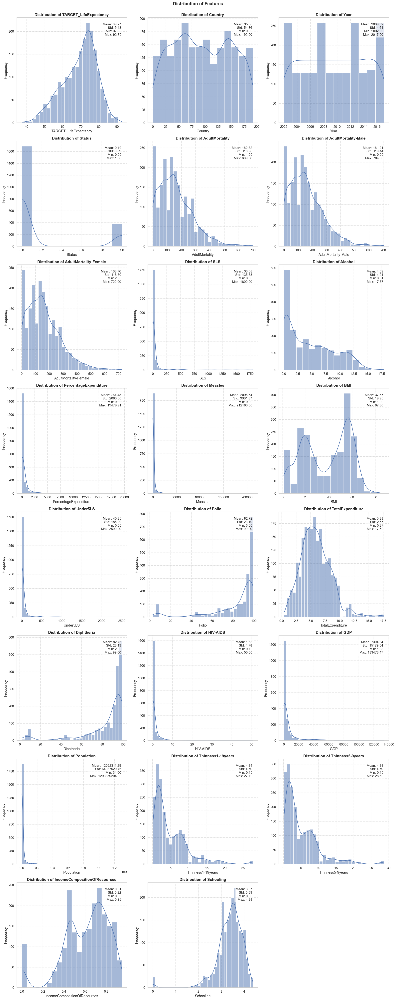

In [13]:
# Plot all numeric features
fig = plot_distribution_grid(df, figsize=(20, 50))
plt.show()

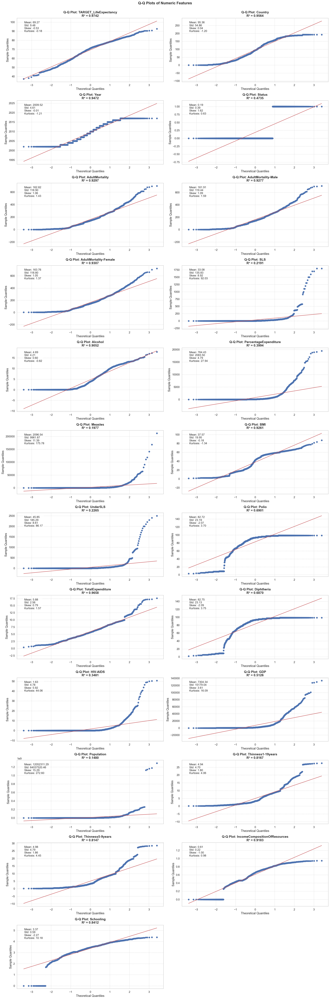

In [14]:
# Create and display QQ plots
qq_fig = plot_qq_grid(df, figsize=(20, 60))
plt.show()

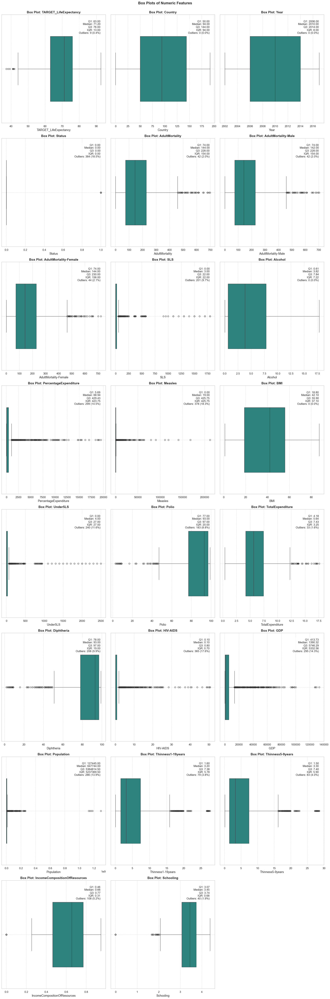

In [15]:
# Create and display box plots
box_fig = plot_boxplot_grid(df, figsize=(20, 60))
plt.show()

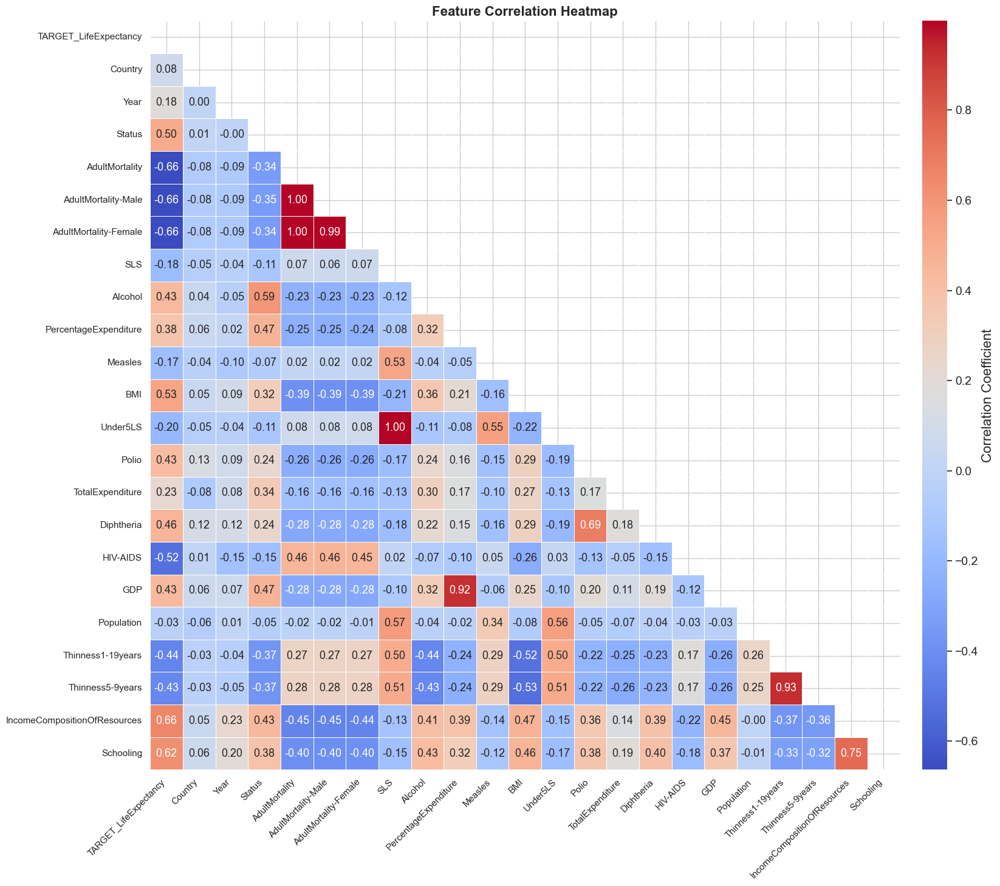

In [16]:
heatmap_fig = plot_correlation_heatmap(df, annot_fontsize=13, figsize=(20,15))
plt.show()

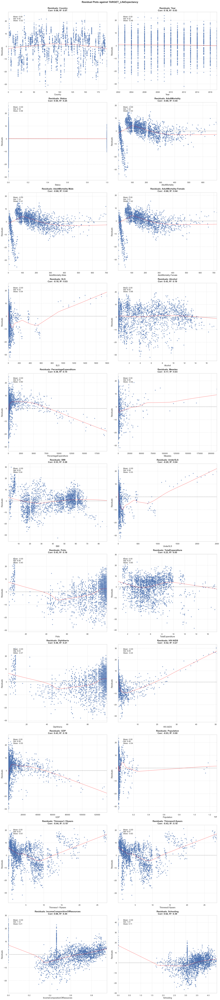

In [17]:
residual_fig = plot_residual_grid(df, figsize=(20, 90))
plt.show()

- Final decision on features 

# ***Feature Engineering***

## **Feature Extraction**

### *Extraction 1: 'AdultMortality-Male' and 'AdultMortality-Female'*

#### Logical Reasoning

1. **Gender Disparity in Mortality Reflects Health System Differences**:
   - **What it Represents**: `AdultMortality_Diff` captures the difference in adult mortality rates between males and females (probability of dying between ages 15 and 60 per 1000 population). A positive value indicates higher male mortality, while a negative value indicates higher female mortality.
   - **Why it Matters**: Differences in mortality by gender can signal disparities in healthcare access, lifestyle factors (e.g., smoking, alcohol use), or occupational risks, all of which influence overall life expectancy. For example, a country with significantly higher male mortality might have issues like violence or poor occupational safety, reducing average life expectancy.

2. **Complementary to Total Adult Mortality**:
   - **Existing Feature**: The dataset already includes `AdultMortality` (combined rate for both sexes), which provides an overall measure of adult mortality’s impact on life expectancy.
   - **Added Value**: `AdultMortality_Diff` adds a layer of granularity by highlighting gender-specific patterns that `AdultMortality` averages out. For instance, if male and female rates are equal, `AdultMortality_Diff` is zero, but if they diverge significantly, this divergence could correlate with life expectancy in ways the total rate alone doesn’t capture.

3. **Potential Indicator of Societal Factors**:
   - Gender differences in mortality often reflect societal conditions (e.g., gender equality, maternal health, or male-specific risks like war). These factors indirectly affect life expectancy across the population, not just for one gender. Including `AdultMortality_Diff` allows the model to account for such underlying dynamics.

---

#### Statistical Reasoning

1. **Capturing Non-Linear Relationships**:
   - **Why Not Just Use Male and Female Rates Separately?**: The dataset already has `AdultMortality-Male` and `AdultMortality-Female`, so the model could theoretically learn their individual effects. However, their difference (`AdultMortality_Diff`) explicitly isolates the gender gap as a single feature, which might have a non-linear or distinct relationship with life expectancy that’s harder to detect when modeling the two rates independently.
   - **Example**: A large positive `AdultMortality_Diff` (higher male mortality) might disproportionately lower life expectancy if male deaths skew younger, a pattern the combined `AdultMortality` might mask.

2. **Reducing Dimensionality While Preserving Information**:
   - Including both `AdultMortality-Male` and `AdultMortality-Female` (alongside `AdultMortality`) introduces three highly correlated features, as `AdultMortality` is roughly an average of the two. `AdultMortality_Diff` condenses gender-specific information into one feature, complementing `AdultMortality` without adding excessive redundancy. This balances information retention with model simplicity.

3. **Empirical Evidence from Health Studies**:
   - Research in public health (e.g., WHO reports, studies in *The Lancet*) often examines gender differences in mortality as a predictor of population health outcomes. For instance, a higher male mortality rate is linked to lower life expectancy in some regions due to factors like cardiovascular disease or injury, while higher female mortality might reflect maternal health challenges. `AdultMortality_Diff` aligns with this approach, providing a proxy for such patterns.

4. **Low Correlation Assumption**:
   - Unlike `PercentageExpenditure` and `GDP` (correlation 0.92) or `Thinness1-19years` and `Thinness5-9years` (correlation 0.93), the correlation between `AdultMortality-Male` and `AdultMortality-Female` isn’t necessarily extremely high across all countries. While they may be correlated, the difference (`AdultMortality_Diff`) captures variation that isn’t redundant with `AdultMortality`. Even if correlated, tree-based models (e.g., random forests) can still leverage it effectively, and linear models can handle it with regularization if needed.

---

#### Why Keep `AdultMortality`, `AdultMortality-Male`, and `AdultMortality-Female` Alongside It?

- **Distinct Contributions**: 
  - `AdultMortality` gives the overall mortality burden.
  - `AdultMortality-Male` and `AdultMortality-Female` allow the model to assess gender-specific impacts independently (e.g., male mortality might dominate in some contexts, female in others).
  - `AdultMortality_Diff` highlights the disparity, which might have a unique effect (e.g., a large gap could indicate systemic issues).
- **Model Flexibility**: Retaining all four lets the model (especially non-linear ones) decide how to weight each aspect. Dropping `AdultMortality-Male` or `AdultMortality-Female` assumes `AdultMortality` and `AdultMortality_Diff` fully capture their effects, which might not hold if gender-specific trends matter independently.

---

#### Decision

**Include `AdultMortality_Diff`**:
- **Why**: It provides a concise, interpretable measure of gender disparity in mortality, potentially capturing societal or health system factors that influence life expectancy beyond the total mortality rate. It complements existing features without introducing excessive redundancy, given its distinct focus on the gap rather than absolute levels.
- **How It Fits**: Alongside `AdultMortality`, `AdultMortality-Male`, and `AdultMortality-Female`, it enriches the feature set, allowing the model to learn both aggregate and differential effects of adult mortality on life expectancy.

This decision aligns with the goal of enhancing predictive power through meaningful feature engineering, supported by both logical health-related insights and statistical modeling principles. If multicollinearity becomes an issue (e.g., in linear regression), you could revisit this choice post-modeling, but for now, it adds valuable information.

In [18]:
def check_and_update_adult_mortality(df):
    """
    Check the relationship between adult mortality columns and update missing values
    directly in the original dataframe.
    """
    # Calculate the relationship directly in the dataframe
    df['Calculated'] = (df['AdultMortality-Male'] + df['AdultMortality-Female']) / 2
    
    # Check equality for non-null values
    df['IsEqual'] = np.isclose(df['AdultMortality'], df['Calculated'])
    
    # Print relationship statistics
    equal_count = df['IsEqual'].sum()
    total_valid_rows = df.dropna(subset=['AdultMortality', 'Calculated']).shape[0]
    print(f"\nRows where AdultMortality equals (AdultMortality-Male + AdultMortality-Female)/2: {equal_count} out of {total_valid_rows}")
    print(f"Percentage of equal values: {equal_count/total_valid_rows*100:.2f}%")
    
    # Update missing AdultMortality values
    missing_mask = df['AdultMortality'].isnull() & df['AdultMortality-Male'].notnull() & df['AdultMortality-Female'].notnull()
    df.loc[missing_mask, 'AdultMortality'] = df.loc[missing_mask, 'Calculated']
    
    # Print update results
    if missing_mask.any():
        print("\nRows where AdultMortality was filled:")
        print(df.loc[missing_mask, ['AdultMortality', 'AdultMortality-Male', 'AdultMortality-Female', 'Calculated']])
    
    print("\nNumber of null values in AdultMortality after filling:")
    print(df['AdultMortality'].isnull().sum())
    
    # Clean up temporary columns
    df.drop(['Calculated', 'IsEqual'], axis=1, inplace=True)
    
    return df

In [19]:
df = check_and_update_adult_mortality(df)


Rows where AdultMortality equals (AdultMortality-Male + AdultMortality-Female)/2: 2070 out of 2070
Percentage of equal values: 100.00%

Rows where AdultMortality was filled:
     AdultMortality  AdultMortality-Male  AdultMortality-Female  Calculated
202           191.0                  188                    194       191.0

Number of null values in AdultMortality after filling:
0


In [20]:
df = df.drop(columns=['AdultMortality-Male', 'AdultMortality-Female'])

### *Extraction 2: '5SLS' and 'SLS'*

#### Logical Reasoning

1. **Perfect Correlation Implies Identical Information**:
   - **What They Represent**: 
     - `Under5LS`: Number of under-five life spans per 1000 population (likely deaths or short lifespans of children under 5).
     - `SLS`: Number of short life spans per 1000 population (possibly a broader measure of premature deaths).
   - **Correlation = 1**: A correlation of 1 means these two features are perfectly linearly related—either they’re identical, or one is a constant multiple of the other (e.g., `Under5LS = k * SLS`). This suggests they measure the same phenomenon or are mislabeled/duplicated in the dataset.

2. **Redundancy in Representation**:
   - If `Under5LS` and `SLS` are identical or perfectly proportional, including both provides no additional information to the model. For life expectancy, premature deaths (especially in children) are critical, but one feature should suffice to capture this effect.

3. **Contextual Interpretation**:
   - **Hypothesis**: `SLS` might be intended as a general "short lifespan" metric, while `Under5LS` focuses on under-5 mortality. A correlation of 1 could indicate data entry error, a misunderstanding in variable definition, or that `SLS` is entirely composed of under-5 deaths in this dataset. Without further clarification, we assume they’re effectively the same.

---

#### Statistical Reasoning

1. **Perfect Multicollinearity**:
   - A correlation of 1 results in an infinite VIF (VIF = 1 / (1 - 1²) is undefined), meaning the features are perfectly multicollinear. In linear regression, this causes singularity (the design matrix becomes non-invertible), and even in tree-based models, it’s wasteful to include identical predictors.

2. **Model Efficiency**:
   - Including both features doubles the computational load without improving predictive power. Dropping one ensures the model focuses on unique signals, aligning with the principle of parsimony (simpler models are preferred when performance is equal).

3. **Verification Step**:
   - **Check Data**: If possible, confirm whether `Under5LS` and `SLS` are numerically identical (e.g., `df['Under5LS'].equals(df['SLS'])`) or if one is a scaled version. A correlation of 1 strongly suggests they’re the same, but a quick check could clarify.

---

#### Decision
- **Drop `SLS`, Keep `Under5LS`**: 
  - **Why**: With a correlation of 1, they’re redundant. `Under5LS` is more specific (under-5 mortality), which is a well-established predictor of life expectancy in health studies (e.g., WHO’s focus on infant and child mortality). `SLS` is vaguer ("short life spans") and might be a duplicate or less interpretable. Dropping `SLS` avoids redundancy while retaining the more meaningful feature.
  - **Alternative**: If `SLS` were broader (e.g., including adult short lifespans) and the correlation of 1 were an anomaly, we’d reconsider. But given the perfect correlation, `Under5LS` is the safer choice.

In [21]:
df = df.drop(columns=['SLS'])

### *Extraction 3: 'GDP' and 'PercentageExpenditure'*

Below is the decision-making process for including the feature `GDP_Health_Interaction = GDP * PercentageExpenditure` in the dataset for predicting life expectancy. This decision is based on logical reasoning and statistical principles, tailored to your regression problem and the context of your earlier findings (e.g., high correlation between `GDP` and `PercentageExpenditure`).

---

#### Logical Reasoning

1. **Approximation of Health Expenditure Per Capita**:
   - **What it Represents**: `GDP` is the gross domestic product per capita (economic wealth per person), and `PercentageExpenditure` is the percentage of GDP spent on health. Multiplying them (`GDP * PercentageExpenditure`) approximates the total health expenditure per capita in monetary terms (e.g., USD per person spent on health).
   - **Why it Matters**: Health expenditure per capita is a well-established determinant of life expectancy in public health research. Wealthier countries that invest more in healthcare (e.g., through hospitals, doctors, medicine) tend to have higher life expectancies due to better health outcomes.

2. **Capturing the Combined Effect**:
   - **Beyond Individual Features**: While `GDP` reflects overall economic resources and `PercentageExpenditure` shows health prioritization, their product captures the actual scale of health investment. For example:
     - A country with high GDP but low health spending (small `PercentageExpenditure`) might have limited health resources despite wealth.
     - A poor country (low GDP) with high health spending might still lack sufficient absolute funds.
   - **Why Include It**: The interaction term reflects how these two factors work together, providing a more direct link to healthcare quality and availability than either feature alone.

3. **Relevance to Life Expectancy**:
   - Health investment directly affects mortality rates, disease prevention, and longevity. By including `GDP_Health_Interaction`, the model can better account for how economic capacity and health policy jointly influence life expectancy, aligning with real-world health economics.

#### Addressing High Correlation (0.92 between `GDP` and `PercentageExpenditure`)
- **Your Finding**: The correlation of 0.92 suggests `GDP` and `PercentageExpenditure` are strongly related—wealthier countries tend to allocate a higher percentage to health.
- **Implication**: This high correlation led to dropping `PercentageExpenditure` to reduce multicollinearity, but retaining `GDP_Health_Interaction` alongside `GDP` ensures the health spending effect isn’t lost. The interaction term still adds value by quantifying the absolute health investment, which `GDP` alone doesn’t fully capture.

---

#### Statistical Reasoning

1. **Interaction Effects in Regression**:
   - **Why an Interaction Term**: In regression models, interaction terms like `GDP * PercentageExpenditure` allow the effect of one variable (e.g., `GDP`) on the target (life expectancy) to vary depending on another (e.g., `PercentageExpenditure`). This is critical when the combined impact differs from the sum of individual effects.
   - **Example**: In a linear model:
     \[
     \text{LifeExpectancy} = \beta_0 + \beta_1 \cdot \text{GDP} + \beta_2 \cdot (\text{GDP} \cdot \text{PercentageExpenditure})
     \]
     \(\beta_2\) captures how health spending amplifies GDP’s effect, which might be missed if only `GDP` is used.

2. **Enhanced Predictive Power**:
   - Health expenditure per capita (approximated by `GDP_Health_Interaction`) is a stronger predictor of life expectancy than GDP alone in many studies (e.g., WHO, World Bank analyses). By including it, the model gains a feature with a direct theoretical link to the target, potentially improving accuracy.

3. **Handling Multicollinearity**:
   - **Context**: The correlation of 0.92 between `GDP` and `PercentageExpenditure` indicates multicollinearity, and `GDP_Health_Interaction` (as their product) is also correlated with both. Dropping `PercentageExpenditure` mitigates this, leaving `GDP` (broader economic indicator) and `GDP_Health_Interaction` (health-specific indicator).
   - **Why Keep It**: For linear models, multicollinearity between `GDP` and `GDP_Health_Interaction` can be managed with regularization (e.g., Ridge regression). For tree-based models (e.g., random forests), multicollinearity is less of an issue, and the interaction term can still contribute to splits, justifying its inclusion.

4. **Empirical Support**:
   - Studies in health economics (e.g., *The Lancet*, OECD reports) frequently use health expenditure per capita as a key variable for life expectancy models. Since your dataset doesn’t provide this directly, `GDP * PercentageExpenditure` serves as a proxy, aligning with established practice.

---

#### Why Keep `GDP` Alongside `GDP_Health_Interaction`?
- **Distinct Roles**: 
  - `GDP` captures overall economic capacity, influencing life expectancy through non-health factors (e.g., education, infrastructure).
  - `GDP_Health_Interaction` focuses on health investment, a subset of GDP’s impact.
- **Post-Log Transformation**: `GDP` is log-transformed (`log(1 + GDP)`), while `GDP_Health_Interaction` uses the original `GDP` scale multiplied by `PercentageExpenditure`. This reduces their correlation slightly, allowing both to contribute uniquely.

---

#### Decision
- **Include `GDP_Health_Interaction = GDP * PercentageExpenditure` and Drop `PercentageExpenditure`**:
  - **Why**: The interaction term approximates health expenditure per capita, a critical driver of life expectancy, capturing the joint effect of economic wealth and health prioritization. Its inclusion enhances the model’s ability to link healthcare investment to the target, supported by health economics theory and statistical modeling principles.
  - **Why Drop `PercentageExpenditure`**: The high correlation (0.92) with `GDP` makes it largely redundant, and `GDP_Health_Interaction` subsumes its health-related signal. Retaining `GDP` ensures broader economic effects are modeled, while the interaction focuses on health spending.

This decision balances predictive power, theoretical relevance, and multicollinearity management, optimizing the feature set for your regression task.


**Logical Reasoning**:
- Both thinness measures reflect nutritional status, but for slightly different age groups. A correlation of 0.93 suggests they’re almost interchangeable, and their average (`Avg_Thinness`) might suffice to represent overall thinness prevalence.
- Keeping both could allow the model to detect subtle differences (e.g., if one age group’s thinness has a unique impact on life expectancy), but the high correlation implies this is unlikely.

**Statistical Reasoning**:
- With a correlation of 0.93, VIF would be high (R² ≈ 0.8649, VIF ≈ 7.4+), signaling multicollinearity in linear models. For predictive accuracy, one feature or their average is likely sufficient.
- The average (`Avg_Thinness`) reduces dimensionality while retaining the essence of both, a common practice in feature engineering when features are highly correlated.

**Decision**: 
- **Drop Both, Keep `Avg_Thinness`**: Use `Avg_Thinness` as the sole thinness feature. This simplifies the model, reduces multicollinearity, and aligns with the intuition that a single nutritional indicator is adequate given their near-identical behavior.

In [22]:
df['GDP_Health_Interaction'] = df['GDP'] * df['PercentageExpenditure']
df = df.drop(columns=['PercentageExpenditure'])

### *Extraction 4: 'GDP' and 'PercentageExpenditure'*

Below is the decision-making process for including the feature `Avg_Thinness = (Thinness1-19years + Thinness5-9years) / 2` in the dataset for predicting life expectancy. This decision is based on logical reasoning and statistical principles, incorporating your earlier finding that the correlation between `Thinness1-19years` and `Thinness5-9years` is 0.93.

---

#### Logical Reasoning

1. **Consolidation of Nutritional Status**:
   - **What it Represents**: `Thinness1-19years` measures the prevalence of thinness (underweight individuals) among ages 10-19, while `Thinness5-9years` measures it for ages 5-9. Averaging them into `Avg_Thinness` creates a single feature representing thinness across a broader age range (5-19 years).
   - **Why it Matters**: Thinness reflects malnutrition or undernutrition, which impacts child and adolescent health, leading to long-term effects on life expectancy (e.g., stunted growth, increased disease susceptibility). A combined metric simplifies this signal into a unified indicator of nutritional health.

2. **High Correlation Suggests Redundancy**:
   - **Your Finding**: The correlation between `Thinness1-19years` and `Thinness5-9years` is 0.93, indicating they are nearly identical in their variation across the dataset. This suggests that thinness prevalence is highly consistent between these age groups, likely due to shared socioeconomic or environmental factors (e.g., food security, poverty).
   - **Why Average Them**: With such high similarity, keeping both features separately provides little additional insight. Averaging them reduces redundancy while preserving their core contribution to life expectancy.

3. **Relevance to Life Expectancy**:
   - Malnutrition during childhood and adolescence is a known risk factor for reduced life expectancy, as it affects physical development and resilience to disease. `Avg_Thinness` captures this overarching trend, making it a logically sound feature for the regression problem.

---

#### Statistical Reasoning

1. **Mitigating Multicollinearity**:
   - **Impact of Correlation**: A correlation of 0.93 between `Thinness1-19years` and `Thinness5-9years` results in a high Variance Inflation Factor (VIF ≈ 7.4, where VIF = 1 / (1 - 0.93²) ≈ 1 / 0.1351). In linear regression, this level of multicollinearity can inflate coefficient variance, making estimates unstable or harder to interpret.
   - **Solution**: By averaging them into `Avg_Thinness` and dropping the originals, multicollinearity is eliminated, improving model stability without sacrificing information.

2. **Feature Engineering Efficiency**:
   - **Best Practice**: When two features are highly correlated and conceptually aligned (here, both measure thinness in adjacent age groups), combining them into a single feature (e.g., via averaging) is a standard technique in feature engineering. This reduces dimensionality, a key consideration in regression modeling to avoid overfitting and computational waste.
   - **Precedent**: Similar approaches are used in health datasets (e.g., averaging related biomarkers in medical studies) to streamline analysis while retaining predictive power.

3. **Preservation of Signal**:
   - **Why Not Drop One?**: Dropping one thinness measure entirely (e.g., keeping only `Thinness1-19years`) risks losing slight variations in the other, even if minor. Averaging ensures both contribute equally to `Avg_Thinness`, smoothing out noise while maintaining the overall trend.
   - **High Correlation Supports This**: With 0.93 correlation, the difference between the two is minimal, so their average is a robust summary statistic.

4. **Empirical Support**:
   - Health studies (e.g., UNICEF, WHO reports) often aggregate nutritional indicators across age groups to assess population health. Thinness prevalence is a proxy for undernutrition, and its impact on life expectancy is well-documented. Averaging aligns with this practice, providing a practical and interpretable feature.

---

#### Why Drop `Thinness1-19years` and `Thinness5-9years`?

- **Redundancy**: The 0.93 correlation indicates that either feature alone could represent thinness, but averaging them into `Avg_Thinness` captures their shared signal more efficiently. Keeping both alongside `Avg_Thinness` would triplicate the same information, unnecessarily bloating the feature set.
- **Model Simplicity**: Dropping the originals reduces the number of features, aligning with the principle of parsimony—favoring simpler models when predictive power is equivalent.

---

#### Decision
- **Include `Avg_Thinness = (Thinness1-19years + Thinness5-9years) / 2` and Drop `Thinness1-19years` and `Thinness5-9years`**:
  - **Why**: The high correlation (0.93) and conceptual overlap between `Thinness1-19years` and `Thinness5-9years` justify combining them into a single feature. `Avg_Thinness` provides a concise, meaningful measure of nutritional status across ages 5-19, reducing multicollinearity and dimensionality while retaining its relevance to life expectancy.
  - **Support**: This decision is backed by the logical link between malnutrition and life expectancy, statistical efficiency in handling correlated features, and alignment with health research practices.

This feature enhances the dataset by simplifying the representation of thinness without losing its predictive value, making it a smart addition to your regression model.

In [23]:
df['Avg_Thinness'] = (df['Thinness1-19years'] + df['Thinness5-9years']) / 2
df = df.drop(columns=['Thinness1-19years', 'Thinness5-9years'])

### Recheck the distribution

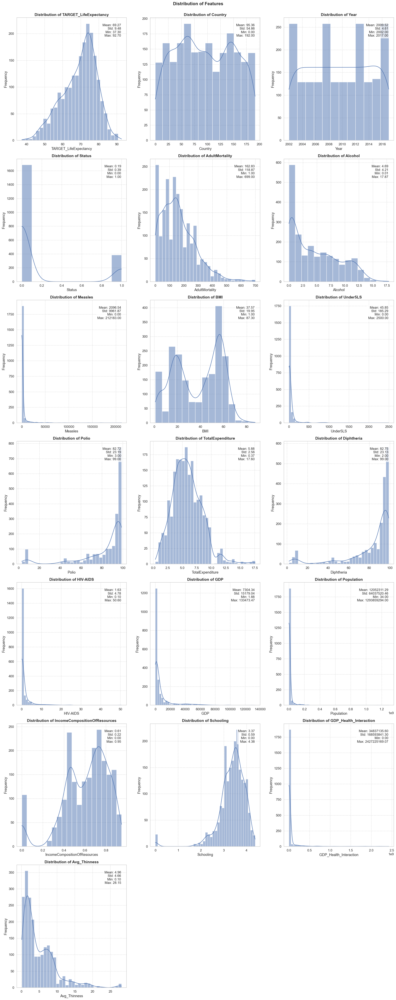

In [24]:
# Plot all numeric features
fig = plot_distribution_grid(df, figsize=(20, 50))
plt.show()

## **Splitting Dataset**

- Reason tsao nen split dataset trc feature extraction 

In [25]:
X = df.drop('TARGET_LifeExpectancy', axis=1)
y = df['TARGET_LifeExpectancy']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## **Imputation**

In [26]:
def compare_imputation_techniques(X_train, X_test, y_train, y_test):
    # Create imputers
    zero_imputer = SimpleImputer(strategy='constant', fill_value=0)
    mean_imputer = SimpleImputer(strategy='mean')
    median_imputer = SimpleImputer(strategy='median')
    knn_imputer = KNNImputer(n_neighbors=5)
    iterative_imputer = IterativeImputer(random_state=42)

    # Perform zero imputation and save the imputed dataset
    X_train_zero = zero_imputer.fit_transform(X_train)
    X_test_zero = zero_imputer.transform(X_test)

    # Perform mean imputation and save the imputed dataset
    X_train_mean = mean_imputer.fit_transform(X_train)
    X_test_mean = mean_imputer.transform(X_test)

    # Perform median imputation and save the imputed dataset
    X_train_median = median_imputer.fit_transform(X_train)
    X_test_median = median_imputer.transform(X_test)

    # Perform KNN imputation and save the imputed dataset
    X_train_knn = knn_imputer.fit_transform(X_train)
    X_test_knn = knn_imputer.transform(X_test)

    # Perform iterative imputation and save the imputed dataset
    X_train_iterative = iterative_imputer.fit_transform(X_train)
    X_test_iterative = iterative_imputer.transform(X_test)

    # Perform listwise deletion imputation and save the imputed dataset
    X_train_listwise = X_train.dropna()
    y_train_listwise = y_train[X_train_listwise.index]
    X_test_listwise = X_test.dropna()
    y_test_listwise = y_test[X_test_listwise.index]

    # Train and evaluate models
    models = [
        ('Zero Imputation', RandomForestRegressor(random_state=42), X_train_zero, X_test_zero),
        ('Mean Imputation', RandomForestRegressor(random_state=42), X_train_mean, X_test_mean),
        ('Median Imputation', RandomForestRegressor(random_state=42), X_train_median, X_test_median),
        ('KNN Imputation', RandomForestRegressor(random_state=42), X_train_knn, X_test_knn),
        ('Iterative Imputation', RandomForestRegressor(random_state=42), X_train_iterative, X_test_iterative),
        ('Listwise Deletion', RandomForestRegressor(random_state=42), X_train_listwise, X_test_listwise)
    ]
    rmse_scores = []
    for name, model, X_train_imputed, X_test_imputed in models:
        if name == 'Listwise Deletion':
            model.fit(X_train_imputed, y_train_listwise)
            y_pred = model.predict(X_test_imputed)
            rmse = np.sqrt(mean_squared_error(y_test_listwise, y_pred))
        else:
            model.fit(X_train_imputed, y_train)
            y_pred = model.predict(X_test_imputed)
            rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        rmse_scores.append(rmse)
        print(f'{name} - RMSE: {rmse:.9f}')
        
    plt.figure(figsize=(20, 8))
    plt.plot(['Zero Imputation', 'Mean Imputation', 'Median Imputation', 'KNN Imputation', 'Iterative Imputation', 'Listwise Deletion'], rmse_scores, marker='o', markersize=10)
    plt.xlabel('Imputation Technique')
    plt.ylabel('RMSE')
    plt.title('Comparison of Imputation Techniques')

    # Add RMSE values on each dot
    for i, score in enumerate(rmse_scores):
        plt.text(i, score, f'{score:.4f}', ha='center', va='bottom')

    plt.show()

Zero Imputation - RMSE: 2.846577566
Mean Imputation - RMSE: 2.888859437
Median Imputation - RMSE: 2.925813608
KNN Imputation - RMSE: 2.870151131
Iterative Imputation - RMSE: 2.848149604
Listwise Deletion - RMSE: 2.865233159


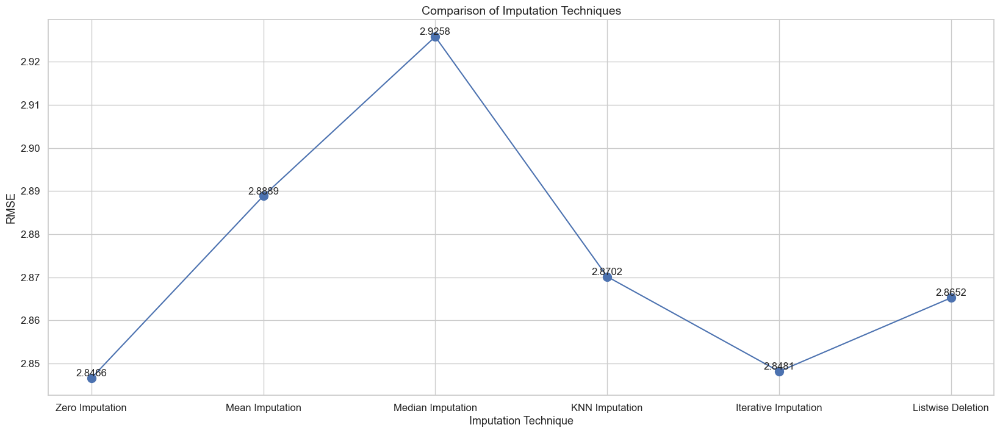

In [27]:
compare_imputation_techniques(X_train, X_test, y_train, y_test)

In [28]:
zero_imputer = SimpleImputer(strategy='constant', fill_value=0)

X_train_imputed = zero_imputer.fit_transform(X_train)
X_test_imputed = zero_imputer.transform(X_test)

# Convert the imputed arrays back to DataFrames
X_train = pd.DataFrame(X_train_imputed, columns=X_train.columns)
X_test = pd.DataFrame(X_test_imputed, columns=X_test.columns)

## **Feature Transformation**

In [29]:
def apply_normal_tranformation(X_train, X_test, features=None):
    X_train_normal = X_train.copy()
    X_test_normal = X_test.copy()
    
    qt = QuantileTransformer(output_distribution='normal')
    
    for feature in features:
        train_feature_df = X_train[feature].to_frame()
        test_feature_df = X_test[feature].to_frame()
        
        X_train_normal[feature] = qt.fit_transform(train_feature_df)    
        X_test_normal[feature] = qt.transform(test_feature_df)    
        
    return X_train_normal, X_test_normal

In [30]:
def apply_feature_scaling(X_train, X_test, features=None):
    X_train_scaled = X_train.copy()
    X_test_scaled = X_test.copy()
    
    scaler = StandardScaler()
    
    for feature in features:
        train_feature_df = X_train[feature].to_frame()
        test_feature_df = X_test[feature].to_frame()
        
        X_train_scaled[feature] = scaler.fit_transform(train_feature_df)    
        X_test_scaled[feature] = scaler.transform(test_feature_df)    
        
    return X_train_scaled, X_test_scaled

In [31]:
def apply_target_encoding(X_train, X_test, features, y_train):
    X_train_encoded = X_train.copy()
    X_test_encoded = X_test.copy()
    
    # Initialize and fit the target encoder
    encoder = TargetEncoder()
    
    for feature in features:
        # Reshape the feature as DataFrame with a single column
        train_feature_df = X_train[feature].to_frame()
        test_feature_df = X_test[feature].to_frame()
        
        X_train_encoded[feature] = encoder.fit_transform(train_feature_df, y_train)
        X_test_encoded[feature] = encoder.transform(test_feature_df)
        
    return X_train_encoded, X_test_encoded

### *Transformation 1: 'Country'*

#### Comparison of Encoding Techniques

1. One-Hot Encoding
   - **How it Works**: Creates a binary column for each unique country (e.g., `Country_146`, `Country_154`, etc.), with 1s and 0s indicating presence.
   - **Pros**:
     - Preserves all categorical information without assuming order.
     - Works well for low-cardinality features.
   - **Cons**:
     - **High Dimensionality**: If there are 50+ countries (common in global datasets), this generates 50+ new features, significantly increasing the dataset’s dimensionality. For your dataset, with potentially 100+ countries, this could mean hundreds of columns.
     - **Sparsity**: Most entries are 0s, leading to a sparse matrix, which increases computational cost and memory usage.
     - **Overfitting Risk**: With limited observations per country (e.g., a few years’ data), rare countries might lead to noisy, overfitted coefficients in regression models.
   - **Suitability**: Poor for high-cardinality features like `Country` in a regression task, as it bloats the feature space and complicates modeling.

2. Label Encoding
   - **How it Works**: Assigns a unique integer to each country (e.g., 146 → 1, 154 → 2, 9 → 3).
   - **Pros**:
     - Simple and compact (one column).
     - Low computational overhead.
   - **Cons**:
     - **Implies Ordinality**: Regression models interpret integers as ordered (e.g., country 3 > country 2), which is meaningless for `Country`. Life expectancy doesn’t increase or decrease with country index numbers.
     - **No Target Relationship**: Ignores the relationship between `Country` and `TARGET-LifeExpectancy`, losing valuable predictive information.
   - **Suitability**: Inappropriate for regression with nominal (unordered) categorical variables like `Country`, as it introduces artificial ordering.

3. Frequency Encoding
   - **How it Works**: Replaces each country with the frequency of its occurrence in the dataset (e.g., if country 146 appears 10 times, it becomes 10).
   - **Pros**:
     - Compact (one column).
     - Captures sample size per country, which might reflect data reliability.
   - **Cons**:
     - **No Direct Relevance**: Frequency of a country in the dataset (e.g., more data points for larger countries) doesn’t inherently relate to life expectancy. It might correlate with population size but not health outcomes.
     - **Loss of Specificity**: Countries with the same frequency get the same value, even if their life expectancies differ vastly (e.g., a small healthy country vs. a small unhealthy one).
   - **Suitability**: Weak for this task, as it doesn’t leverage the target variable or reflect country-specific effects on life expectancy.

4. Target Encoding
   - **How it Works**: Replaces each country with the mean `TARGET-LifeExpectancy` for that country, calculated from the training set (e.g., if country 146 has an average life expectancy of 75, it becomes 75).
   - **Pros**:
     - **Compact**: Reduces `Country` to a single numerical column, avoiding dimensionality explosion.
     - **Target-Relevant**: Directly incorporates the relationship between `Country` and life expectancy, encoding each country with a value that reflects its typical outcome.
     - **Interpretable**: The encoded value (mean life expectancy) is intuitively meaningful for a regression task predicting life expectancy.
   - **Cons**:
     - **Data Leakage Risk**: If not split properly (e.g., using test data in the mean calculation), it can leak target information. This is mitigated by computing means only on the training set.
     - **Overfitting Risk**: For countries with few observations, the mean might be noisy. This can be addressed with smoothing techniques (e.g., adding a global mean component), though your dataset likely has enough data per country to avoid this.
   - **Suitability**: Highly suitable for high-cardinality categorical features in regression, especially when the category (country) strongly influences the target (life expectancy).

---

#### Logical Reasoning for Target Encoding

1. **Country-Specific Effects on Life Expectancy**:
    - Countries have distinct baseline life expectancies due to factors like healthcare infrastructure, socioeconomic conditions, and cultural norms. Target encoding captures this by assigning each country its average life expectancy, directly linking the feature to the target variable.

2. **High Cardinality Management**:
   - With potentially dozens or hundreds of countries, one-hot encoding is impractical, while label encoding misrepresents the data. Target encoding efficiently condenses this information into one feature, making it scalable and manageable.

3. **Alignment with Regression Goal**:
   - Since the task is regression (predicting a continuous outcome), encoding `Country` with a continuous, target-related value (mean life expectancy) aligns with the model’s objective. It provides a meaningful numerical input that reflects each country’s typical life expectancy.

---

#### Statistical Reasoning for Target Encoding

1. **Improved Predictive Power**:
   - By encoding `Country` with its mean life expectancy, the feature becomes a strong predictor, as it summarizes country-specific trends in the target variable. This is particularly effective in regression, where the model can use this signal to adjust predictions.

2. **Dimensionality Reduction**:
   - Unlike one-hot encoding, which scales linearly with the number of countries, target encoding keeps the feature space compact (one column). This reduces the risk of the “curse of dimensionality,” where too many features relative to observations degrade model performance.

3. **Empirical Success**:
   - Target encoding is widely used in machine learning competitions (e.g., Kaggle) and real-world applications for high-cardinality categorical variables in regression tasks. Its success stems from balancing simplicity with target-informed encoding, making it a proven choice.

4. **Mitigating Drawbacks**:
   - **Leakage**: Using training set means only (as implemented in your code) prevents leakage into the test set.
   - **Noise**: With multiple years per country (common in life expectancy datasets), the mean is a robust estimate, minimizing overfitting concerns.

---

#### Why Target Encoding is Best Compared to Alternatives
- **Vs. One-Hot Encoding**: Avoids dimensionality explosion (e.g., 100 countries → 100 columns) and sparsity, which are impractical for high-cardinality features and regression.
- **Vs. Label Encoding**: Eliminates the false ordinality problem, providing a meaningful numerical representation tied to the target.
- **Vs. Frequency Encoding**: Offers a direct connection to life expectancy rather than an unrelated metric (frequency), enhancing relevance.

---

#### Decision
- **Use Target Encoding for `Country`**:
  - **Why**: Target encoding is the best suitable technique because it efficiently handles the high cardinality of `Country`, directly incorporates its relationship with `TARGET-LifeExpectancy`, and provides a compact, interpretable feature for regression. It outperforms one-hot encoding (too many dimensions), label encoding (meaningless order), and frequency encoding (irrelevant to target), aligning with both logical health-related insights and statistical modeling efficiency.
  - **Implementation**: Replace `Country` with the mean life expectancy per country from the training set, ensuring no data leakage and maximizing predictive utility.

This choice optimizes the feature set for your life expectancy prediction task, leveraging country-specific patterns effectively.

In [32]:
X_train, X_test = apply_target_encoding(X_train, X_test, ['Country'], y_train)

### *Transformation 2: Apply Log Transformation*

In [33]:
normal_transform_features = [
    'Measles', 
    'GDP', 
    'Population', 
    'GDP_Health_Interaction', 
    'Under5LS', 
    'HIV-AIDS', 
    'AdultMortality'
]

In [34]:
X_train_normal, X_test_normal = apply_normal_tranformation(X_train, X_test,normal_transform_features)

### *Transformation 3: Apply Feature Scaling*

In [35]:
scale_features = [
    'Country',
    'Year',
    'BMI',
    'Alcohol',
    'TotalExpenditure',
    'Polio',
    'Diphtheria',
    'Schooling',
    'Avg_Thinness',
    'IncomeCompositionOfResources'
]


In [36]:
X_train_scaled, X_test_scaled = apply_feature_scaling(X_train_normal, X_test_normal, scale_features)

## **Feature Selection**

### **Filter-based method**

#### ***Variance Threshold***

In [38]:
thresholds = np.arange(0, .5, 0.01)

In [57]:
def vt_feature_selection(X_train, y_train, thresholds):
    results = []
    selected_features_list = []

    for threshold in thresholds:
        # Apply Variance Threshold
        selector = VarianceThreshold(threshold=threshold)
        X_selected = selector.fit_transform(X)
        
        # Get the selected features
        selected_features = X.columns[selector.get_support()]
        selected_features_list.append(selected_features)
        
        # Train a model with selected features
        X_train, X_test, y_train, y_test = train_test_split(X_selected, y, test_size=0.2, random_state=42)
        
        model = RandomForestRegressor(random_state=42)
        
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        
        # Evaluate model
        metric = mean_squared_error(y_test, y_pred)
        results.append(metric)
    
    return results, selected_features_list

In [42]:
def plot_vt_results(thresholds, results, best_threshold):
    plt.figure(figsize=(12, 8))
    plt.plot(thresholds, results, marker='o', linestyle='-', color='b')
    plt.axvline(x=best_threshold, color='r', linestyle='--', label=f'Best Threshold: {best_threshold}')
    plt.xlabel('Variance Threshold')
    plt.ylabel('Model Accuracy')
    plt.title('Model Accuracy vs. Variance Threshold')
    plt.legend()
    plt.grid(True)
    plt.show()

In [46]:
# Find the best threshold and corresponding features
vt_result, selected_features = vt_feature_selection(X_train_scaled, y_train, thresholds)

In [47]:
optimal_threshold = thresholds[np.argmin(a=vt_result)]
vt_selected_features = selected_features[np.argmin(vt_result)]
vt_best_accuracy = np.max(vt_result)

print(f"Optimal Threshold: {optimal_threshold}")
print(f"Best Accuracy (MSE): {vt_best_accuracy}")
print(f"Selected Features at Best Threshold: {vt_selected_features}")

Optimal Threshold: 0.16
Best Accuracy (MSE): 8.204793683734938
Selected Features at Best Threshold: Index(['Country', 'Year', 'AdultMortality', 'Alcohol', 'Measles', 'BMI',
       'Under5LS', 'Polio', 'TotalExpenditure', 'Diphtheria', 'HIV-AIDS',
       'GDP', 'Population', 'IncomeCompositionOfResources', 'Schooling',
       'GDP_Health_Interaction', 'Avg_Thinness'],
      dtype='object')


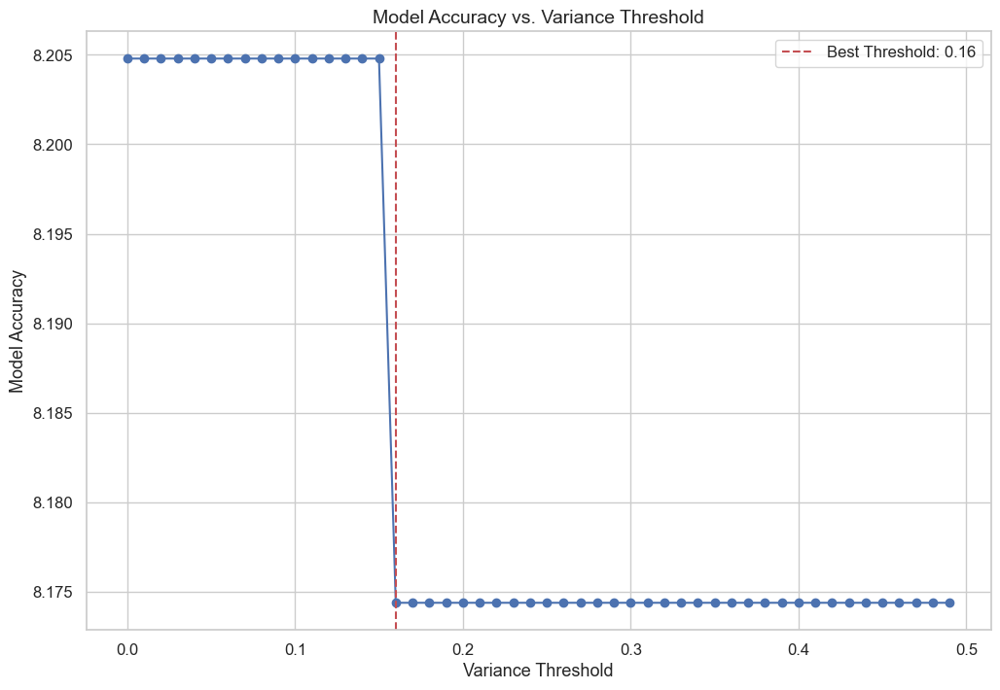

In [48]:
plot_vt_results(thresholds=thresholds, results=vt_result, best_threshold=optimal_threshold)

#### **Pearson Correlation**

In [50]:
def pc_feature_selection(X_train, threshold=0.75):
    # Calculate correlation matrix
    corr_matrix = X_train.corr()
    
    # Find highly correlated pairs and identify features to drop
    features_to_drop = set()
    corr_pairs = []
    
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if corr_matrix.iloc[i, j] > threshold:
                feat1, feat2 = corr_matrix.columns[i], corr_matrix.columns[j]
                corr_pairs.append((feat1, feat2, corr_matrix.iloc[i, j]))
                
                if X_train[feat1].var() < X_train[feat2].var():
                    features_to_drop.add(feat1)
                else:
                    features_to_drop.add(feat2)
    
    # Select features
    selected_features = [col for col in X_train.columns if col not in features_to_drop]
    
    return selected_features, list(features_to_drop), corr_pairs

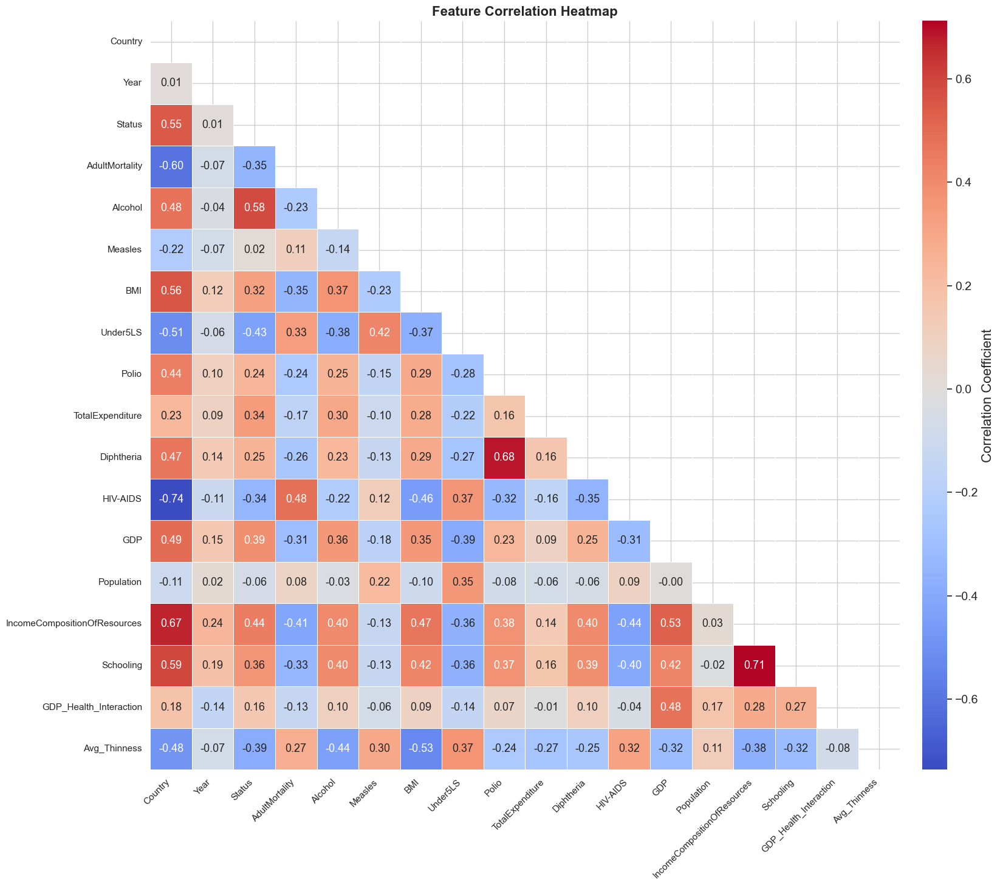

In [54]:
# Get the correlation matrix
heatmap_fig = plot_correlation_heatmap(X_train_scaled, annot_fontsize=13, figsize=(20,15))
plt.show()

In [56]:
pc_selected_features, dropped_features, corr_pairs = pc_feature_selection(X_train_scaled, 0.7)
print(f"Correlation pairs: \n {corr_pairs} \n")
print(f"Dropped features: \n {dropped_features} \n")
print(f"Selected features: \n {pc_selected_features}\n")

Correlation pairs: 
 [('Schooling', 'IncomeCompositionOfResources', 0.7116586430349408)] 

Dropped features: 
 ['Schooling'] 

Selected features: 
 ['Country', 'Year', 'Status', 'AdultMortality', 'Alcohol', 'Measles', 'BMI', 'Under5LS', 'Polio', 'TotalExpenditure', 'Diphtheria', 'HIV-AIDS', 'GDP', 'Population', 'IncomeCompositionOfResources', 'GDP_Health_Interaction', 'Avg_Thinness']



#### **Mutal Information**

In [60]:
def mi_feature_selection(X_train, y_train, n_features=10):
    mutual_info = mutual_info_regression(X_train, y_train)
    
    # Rank features by mutual information
    mi_scores = pd.Series(mutual_info, index=X.columns).sort_values(ascending=False)
    
    # Select top N features
    top_features = mi_scores.head(n_features).index.tolist()
    
    return top_features, mi_scores

In [61]:
mi_top_features, mi_scores = mi_feature_selection(X_train_scaled, y_train)
print("Top 10 Features (Mutual Information):")
print(mi_top_features)

Top 10 Features (Mutual Information):
['Country', 'AdultMortality', 'IncomeCompositionOfResources', 'Schooling', 'Avg_Thinness', 'HIV-AIDS', 'BMI', 'Under5LS', 'GDP', 'GDP_Health_Interaction']


In [62]:
rfg = RandomForestRegressor(random_state=42)
rfg.fit(X_train_scaled[mi_top_features], y_train)
y_pred = rfg.predict(X_test_scaled[mi_top_features])

mse = mean_squared_error(y_test, y_pred)
print(f"MSE: {mse}")

MSE: 6.9749170819277255


### **Embedding-based method**

#### **Lasso L1 Regularization**

In [93]:
def lasso_feature_selection(X_train, y_train, alpha=0.03, threshold=3e-2):
    # Initialize and train Lasso model
    lasso = Lasso(alpha=alpha)
    lasso.fit(X_train, y_train)
    
    # Get feature coefficients
    coef_series = pd.Series(lasso.coef_, index=X.columns)
    
    # Select features with non-zero coefficients
    selected_features = coef_series[abs(coef_series) > threshold].index.tolist()
    
    df_coeff = pd.DataFrame({"features":selected_features,"coeff":coef_series[selected_features].values})
    df_coeff.sort_values("coeff", inplace=True)
    
    return selected_features, coef_series, df_coeff

In [94]:
lasso_selected_features, lasso_coef, lasso_coef_df = lasso_feature_selection(X_train_scaled, y_train)
print(f"Selected features: \n {lasso_selected_features}\n")
print(f"Coef serires: \n {lasso_coef_df}\n")

Selected features: 
 ['Country', 'Year', 'Status', 'AdultMortality', 'Alcohol', 'BMI', 'TotalExpenditure', 'Diphtheria', 'HIV-AIDS', 'GDP', 'IncomeCompositionOfResources', 'Schooling', 'Avg_Thinness']

Coef serires: 
                         features     coeff
8                       HIV-AIDS -0.648909
3                 AdultMortality -0.237384
5                            BMI -0.162494
6               TotalExpenditure -0.101396
12                  Avg_Thinness -0.038633
4                        Alcohol  0.070545
2                         Status  0.104364
9                            GDP  0.120964
10  IncomeCompositionOfResources  0.126199
7                     Diphtheria  0.133364
11                     Schooling  0.203632
1                           Year  1.649442
0                        Country  7.937431



['Country', 'Year', 'Status', 'AdultMortality', 'Alcohol', 'BMI', 'TotalExpenditure', 'Diphtheria', 'HIV-AIDS', 'GDP', 'IncomeCompositionOfResources', 'Schooling', 'Avg_Thinness']


ValueError: x and y must have same first dimension, but have shapes (13,) and (18,)

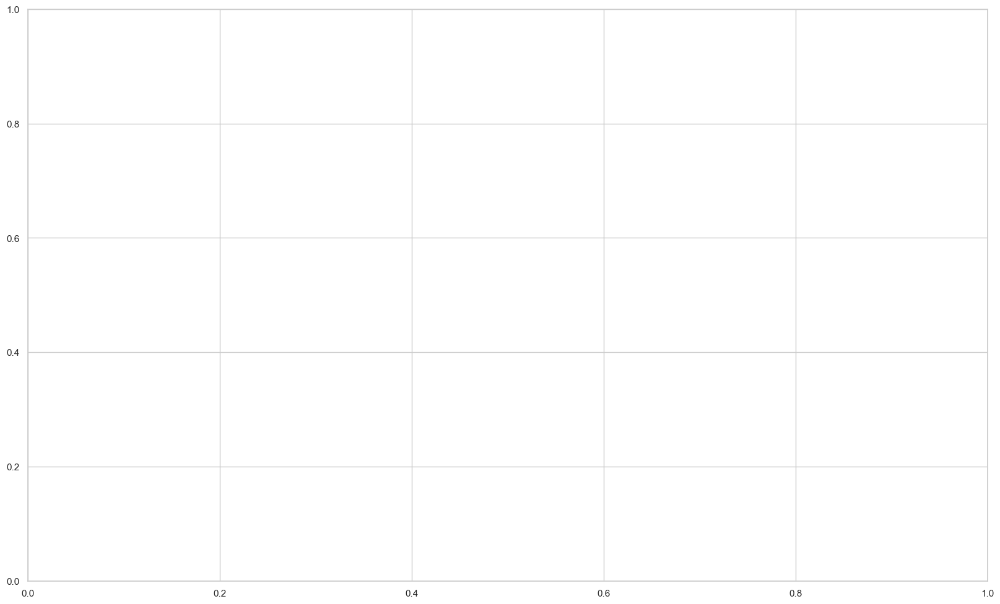

In [99]:
# Lets plot the coeff with features
print(lasso_selected_features)
plt.figure(figsize=(20,12))
plt.plot(range(len(lasso_selected_features)), lasso_coef, color='red', linestyle='dashdot', linewidth = 1,marker='o', 
         markerfacecolor='blue', markersize=5)
plt.xticks(range(len(lasso_selected_features)),lasso_selected_features,rotation=60)
plt.ylabel("Features_Coeff")
plt.show()